In [18]:
import tensorflow as tf
import tensorflow_hub as hub

# For downloading the image.
import matplotlib.pyplot as plt
import tempfile
from six.moves.urllib.request import urlopen
from six import BytesIO

# For drawing onto the image.
import numpy as np
from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps

# For measuring the inference time.
import time

# Print Tensorflow version
print(tf.__version__)

# Check available GPU devices.
print("The following GPU devices are available: %s" % tf.test.gpu_device_name())

2.5.0
The following GPU devices are available: 


In [ ]:
# !wget http://models.tensorpack.com/ImageNetModels/ShuffleNetV2-0.5x.npz
# ./shufflenet.py --eval --data /path/to/ilsvrc --load ShuffleNetV2-0.5x.npz --v2 -r=0.5

In [2]:
# inception resnet version 2
module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"

# 실험 결과에 따라 ssd mobilenet version 2 을 사용할 수 있습니다
#module_handle = "https://tfhub.dev/google/openimages_v4/ssd/mobilenet_v2/1"

# Load model

In [3]:
model = hub.load(module_handle)

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


# Select Default signature

In [4]:
# model에 대해 available한 signature를 확인하기
model.signatures.keys()

KeysView(_SignatureMap({'default': <ConcreteFunction pruned(images) at 0x7F1118AC2A10>}))

In [5]:
detector = model.signatures['default']

# Image를 download하고 pre-processes하기

In [15]:
def download_and_resize_image(url, new_width=256, new_height=256, display=True):
    
    # ".jpg"로 끝나는 임시파일 만들기
    _, filename = tempfile.mkstemp(suffix=".jpg")
    
    # URL 열기
    response = urlopen(url)
    
    # URL로부터 이미지 가져와서 읽기
    image_data = response.read()
    
    # 이미지 데이터를 memory buffer에 넣기
    image_data = BytesIO(image_data)
    
    # Image 열기
    pil_image = Image.open(image_data)
    
    # Image를 resize하기 (ratio가 다를 경우 crop)
    pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS)
    
    # RGB colorspace로 convert하기
    pil_image_rgb = pil_image.convert("RGB")
    
    # Image를 임시파일에 저장하기 
    pil_image_rgb.save(filename, format="JPEG", quality=90)
    
    print("Image downloaded to %s." % filename)

    if display:
        display_image(pil_image)
    
    return filename

Image downloaded to /tmp/tmpevgrudf2.jpg.


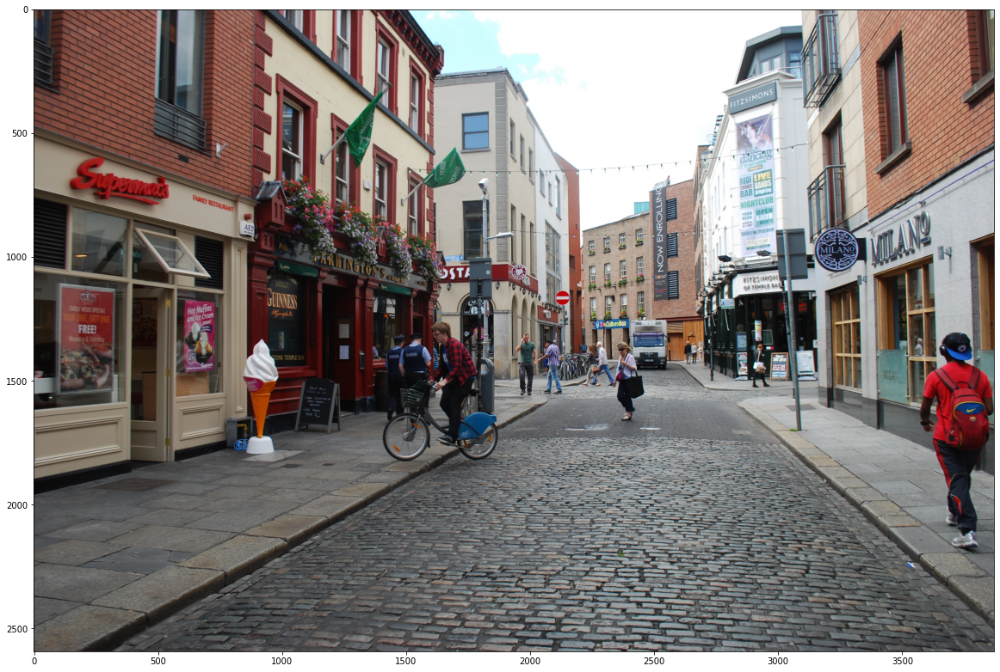

In [16]:
#  URL은 수정 가능
image_url = "https://upload.wikimedia.org/wikipedia/commons/f/fb/20130807_dublin014.JPG"

# image 다운로드 후 기존 높이, 넓이 사용하기
downloaded_image_path = download_and_resize_image(image_url, 3872, 2592)

# Image를 load하고 detector를 run하기



## load_img



In [8]:
def load_img(path):
    
    # 파일 읽기
    img = tf.io.read_file(path)
    
    # tensor로 변환하기
    img = tf.image.decode_jpeg(img, channels=3)
    
    return img

## run_detector



In [22]:
def run_detector(detector, path):
    
    # local file path로부터 이미지 가져오기 
    img = load_img(path)

    start_time = time.time()
    # tensor 앞에 batch dimension 추가하기
    converted_img  = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]
    
    # model을 이용해 inference 실행하기
    result = detector(converted_img)

    end_time = time.time()

    # dictionary에 결과 저장하기
    result = {key:value.numpy() for key,value in result.items()}

    # results 출력하기
    print("Found %d objects." % len(result["detection_scores"]))

    print(result["detection_scores"])
    print(result["detection_class_entities"])
    print(result["detection_boxes"])

    image_with_boxes = draw_boxes(
        img.numpy(), result["detection_boxes"],
        result["detection_class_entities"], result["detection_scores"])

    display_image(image_with_boxes)

# Image에 inference 실행하기

In [10]:
# object detection model을 실행하고 찾은 object 정보를 출력
run_detector(detector, downloaded_image_path)

Found 100 objects.
[0.6532174  0.61050487 0.60152495 0.59255666 0.5917778  0.58154964
 0.550532   0.4957557  0.47424877 0.47322133 0.44066477 0.4051141
 0.39803803 0.3940655  0.3714858  0.36155996 0.3615076  0.34689182
 0.33362356 0.31252867 0.2887799  0.25758353 0.25748897 0.25196075
 0.24782148 0.23412406 0.20432054 0.20324662 0.17988308 0.17964761
 0.1737451  0.16431497 0.16031103 0.15895295 0.15620388 0.15468779
 0.14754449 0.13622597 0.12740111 0.12555613 0.12102704 0.11813033
 0.11387308 0.11229108 0.11129158 0.09718708 0.09137249 0.08976003
 0.0888024  0.08633561 0.08337442 0.08095147 0.07988831 0.0774143
 0.0773216  0.07631025 0.07507852 0.07386057 0.07233316 0.07204045
 0.07110182 0.06935571 0.06825587 0.06427855 0.0624855  0.06226387
 0.06211156 0.05940022 0.05798778 0.05784462 0.05725535 0.05346682
 0.05304348 0.05242869 0.04892596 0.04813037 0.04578473 0.04424176
 0.04337559 0.04277798 0.04262636 0.04163509 0.04081756 0.03976011
 0.03945961 0.03944291 0.03863972 0.03769058 

In [11]:
def display_image(image):
  fig = plt.figure(figsize=(20, 15))
  plt.grid(False)
  plt.imshow(image)

In [19]:
def draw_bounding_box_on_image(image,
                               ymin,
                               xmin,
                               ymax,
                               xmax,
                               color,
                               font,
                               thickness=4,
                               display_str_list=()):
  """Adds a bounding box to an image."""
  draw = ImageDraw.Draw(image)
  im_width, im_height = image.size
  (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                ymin * im_height, ymax * im_height)
  draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
             (left, top)],
            width=thickness,
            fill=color)

  # If the total height of the display strings added to the top of the bounding
  # box exceeds the top of the image, stack the strings below the bounding box
  # instead of above.
  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
  # Each display_str has a top and bottom margin of 0.05x.
  total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

  if top > total_display_str_height:
    text_bottom = top
  else:
    text_bottom = top + total_display_str_height
  # Reverse list and print from bottom to top.
  for display_str in display_str_list[::-1]:
    text_width, text_height = font.getsize(display_str)
    margin = np.ceil(0.05 * text_height)
    draw.rectangle([(left, text_bottom - text_height - 2 * margin),
                    (left + text_width, text_bottom)],
                   fill=color)
    draw.text((left + margin, text_bottom - text_height - margin),
              display_str,
              fill="black",
              font=font)
    text_bottom -= text_height - 2 * margin


In [20]:
def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1):
  """Overlay labeled boxes on an image with formatted scores and label names."""
  colors = list(ImageColor.colormap.values())

  try:
    font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf",
                              25)
  except IOError:
    print("Font not found, using default font.")
    font = ImageFont.load_default()

  for i in range(min(boxes.shape[0], max_boxes)):
    if scores[i] >= min_score:
      ymin, xmin, ymax, xmax = tuple(boxes[i])
      display_str = "{}: {}%".format(class_names[i].decode("ascii"),
                                     int(100 * scores[i]))
      color = colors[hash(class_names[i]) % len(colors)]
      image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
      draw_bounding_box_on_image(
          image_pil,
          ymin,
          xmin,
          ymax,
          xmax,
          color,
          font,
          display_str_list=[display_str])
      np.copyto(image, np.array(image_pil))
  return image

Found 100 objects.
[0.6532174  0.61050487 0.60152495 0.59255666 0.5917778  0.58154964
 0.550532   0.4957557  0.47424877 0.47322133 0.44066477 0.4051141
 0.39803803 0.3940655  0.3714858  0.36155996 0.3615076  0.34689182
 0.33362356 0.31252867 0.2887799  0.25758353 0.25748897 0.25196075
 0.24782148 0.23412406 0.20432054 0.20324662 0.17988308 0.17964761
 0.1737451  0.16431497 0.16031103 0.15895295 0.15620388 0.15468779
 0.14754449 0.13622597 0.12740111 0.12555613 0.12102704 0.11813033
 0.11387308 0.11229108 0.11129158 0.09718708 0.09137249 0.08976003
 0.0888024  0.08633561 0.08337442 0.08095147 0.07988831 0.0774143
 0.0773216  0.07631025 0.07507852 0.07386057 0.07233316 0.07204045
 0.07110182 0.06935571 0.06825587 0.06427855 0.0624855  0.06226387
 0.06211156 0.05940022 0.05798778 0.05784462 0.05725535 0.05346682
 0.05304348 0.05242869 0.04892596 0.04813037 0.04578473 0.04424176
 0.04337559 0.04277798 0.04262636 0.04163509 0.04081756 0.03976011
 0.03945961 0.03944291 0.03863972 0.03769058 

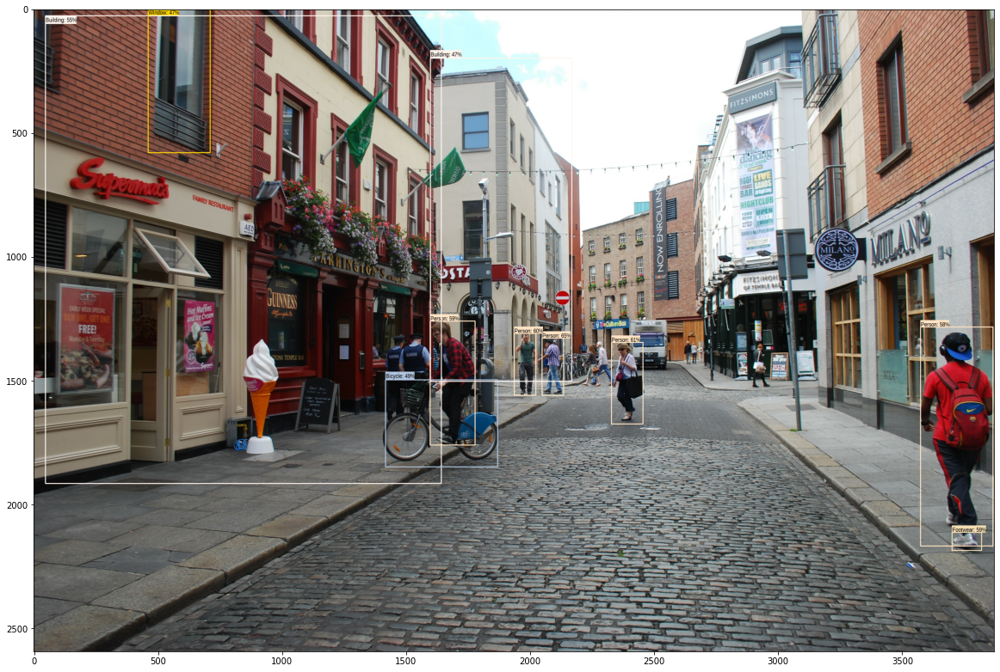

In [23]:
run_detector(detector, downloaded_image_path)

In [24]:
image_urls = [
  # Source: https://commons.wikimedia.org/wiki/File:The_Coleoptera_of_the_British_islands_(Plate_125)_(8592917784).jpg
  "https://upload.wikimedia.org/wikipedia/commons/1/1b/The_Coleoptera_of_the_British_islands_%28Plate_125%29_%288592917784%29.jpg",
  # By Américo Toledano, Source: https://commons.wikimedia.org/wiki/File:Biblioteca_Maim%C3%B3nides,_Campus_Universitario_de_Rabanales_007.jpg
  "https://upload.wikimedia.org/wikipedia/commons/thumb/0/0d/Biblioteca_Maim%C3%B3nides%2C_Campus_Universitario_de_Rabanales_007.jpg/1024px-Biblioteca_Maim%C3%B3nides%2C_Campus_Universitario_de_Rabanales_007.jpg",
  # Source: https://commons.wikimedia.org/wiki/File:The_smaller_British_birds_(8053836633).jpg
  "https://upload.wikimedia.org/wikipedia/commons/0/09/The_smaller_British_birds_%288053836633%29.jpg",
  ]

def detect_img(image_url):
  start_time = time.time()
  image_path = download_and_resize_image(image_url, 640, 480)
  run_detector(detector, image_path)
  end_time = time.time()
  print("Inference time:",end_time-start_time)

Image downloaded to /tmp/tmpcbya939w.jpg.
Found 100 objects.
[0.9778602  0.96267307 0.94962853 0.94943213 0.9402016  0.8503009
 0.8173053  0.57327867 0.45883045 0.35058382 0.17450976 0.09852716
 0.091824   0.07497072 0.0462961  0.04598441 0.04143476 0.03997438
 0.0394312  0.03942183 0.0302166  0.02932605 0.02918889 0.02790137
 0.02694947 0.02456757 0.02300415 0.02189121 0.01929943 0.01920218
 0.01838601 0.01806306 0.01669717 0.0166007  0.01642672 0.01589505
 0.01509037 0.01479326 0.014263   0.01311698 0.01241727 0.01211273
 0.01042734 0.01031189 0.01011782 0.00950787 0.00940578 0.00924832
 0.00874842 0.00818655 0.00766247 0.00733449 0.00732207 0.00723881
 0.00710742 0.00708327 0.00654367 0.00645531 0.00606123 0.00528344
 0.00512486 0.00502356 0.00472782 0.00472187 0.00454739 0.00447641
 0.00402212 0.00397097 0.00393712 0.00356662 0.00334544 0.0032953
 0.0031295  0.00292099 0.00276554 0.0027451  0.00271725 0.00264513
 0.00248088 0.00247556 0.00241141 0.00237939 0.00232677 0.00225014
 0.

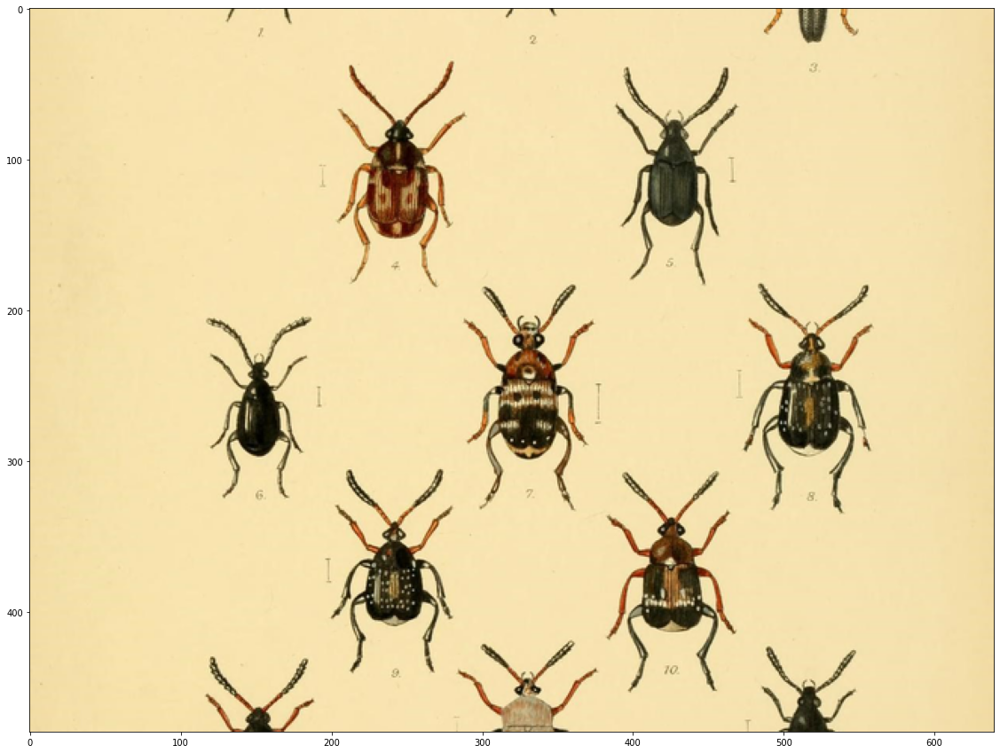

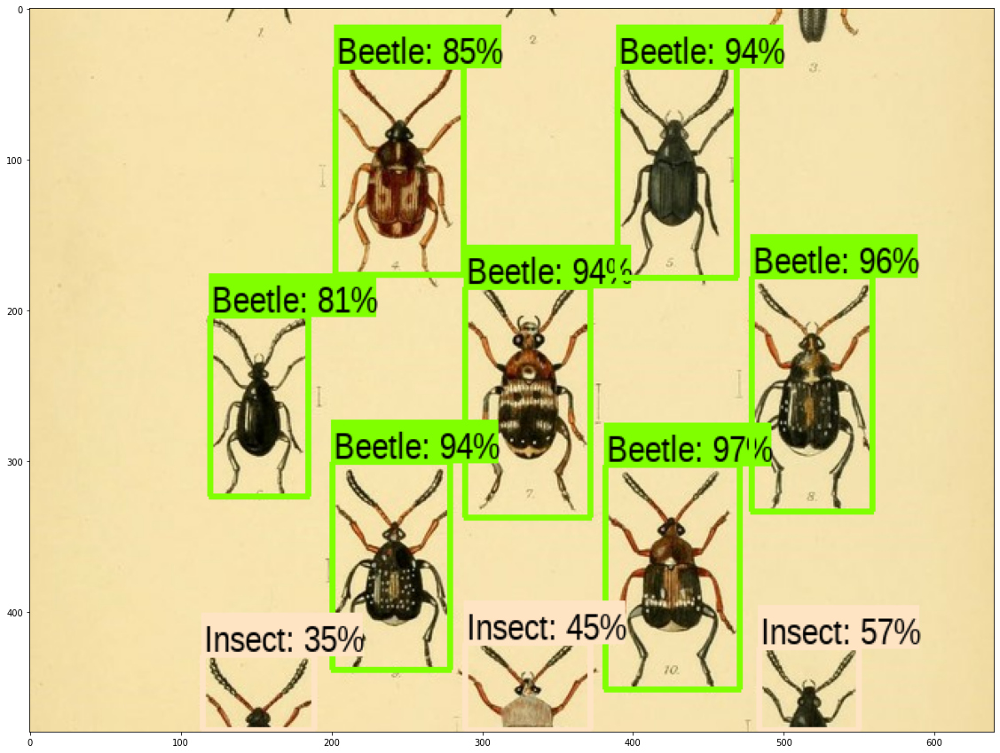

In [25]:
detect_img(image_urls[0])

Image downloaded to /tmp/tmp5p53qvxj.jpg.
Found 100 objects.
[0.9438628  0.8966504  0.811668   0.7742455  0.7385314  0.27011314
 0.24054751 0.17063358 0.17014538 0.12994246 0.07622807 0.07121936
 0.07017539 0.06897265 0.05690195 0.04029796 0.04001255 0.0384497
 0.03647081 0.03269177 0.02800969 0.02719957 0.02541587 0.02319727
 0.02232632 0.02206651 0.02131869 0.02130843 0.02122103 0.02108908
 0.01785859 0.01752539 0.01751805 0.01701842 0.01380871 0.01368601
 0.01203155 0.01146145 0.01145627 0.01117011 0.01079445 0.0107222
 0.01045167 0.01023653 0.00959844 0.00958572 0.00953658 0.00917785
 0.00915181 0.00913876 0.0087928  0.00869647 0.00863887 0.0085592
 0.00845342 0.00845182 0.00820702 0.00805743 0.00768929 0.00747152
 0.00746188 0.00728051 0.00680104 0.00674348 0.00673485 0.00657164
 0.00645279 0.00641498 0.00632671 0.0062899  0.00610057 0.00607275
 0.00590487 0.00535663 0.00524031 0.00485901 0.00481867 0.004723
 0.00470681 0.00459156 0.00452989 0.00452304 0.00449044 0.00437411
 0.004

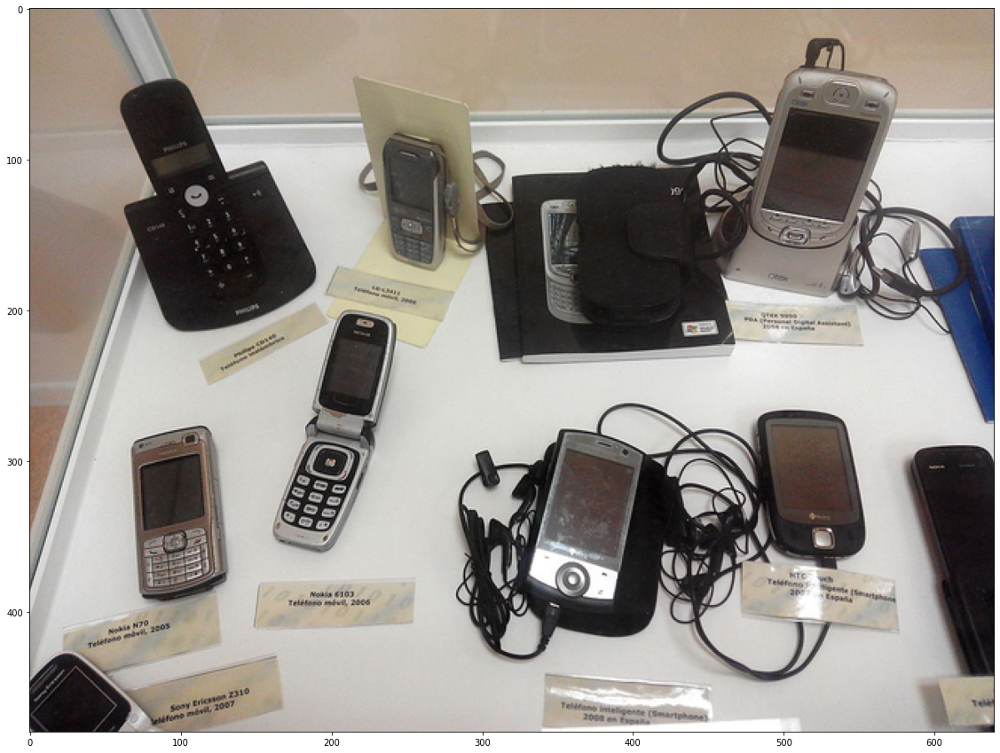

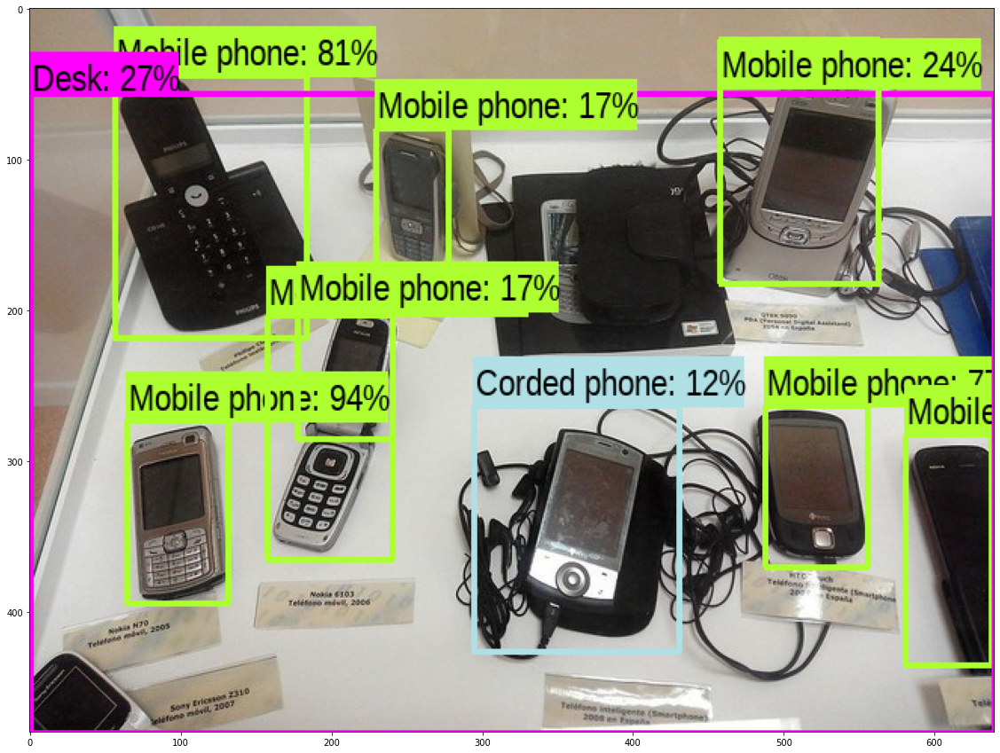

In [26]:
detect_img(image_urls[1])

Image downloaded to /tmp/tmpi1lrlawo.jpg.
Found 100 objects.
[0.9785452  0.8780807  0.8361883  0.75087994 0.5787406  0.4969738
 0.16719407 0.16628617 0.14751278 0.13507436 0.13296498 0.11149085
 0.09334951 0.08116632 0.07980993 0.07343893 0.07275146 0.06550287
 0.06246742 0.04950886 0.04537483 0.03836483 0.03587556 0.03349332
 0.032259   0.0277294  0.02564833 0.02446776 0.02171515 0.02169252
 0.02025029 0.01972705 0.01649119 0.01350194 0.01324134 0.01307821
 0.01302984 0.01294601 0.01261294 0.01256994 0.01206381 0.01167373
 0.01106819 0.00954537 0.00919464 0.00900877 0.00886379 0.00884429
 0.00842479 0.00752402 0.00719705 0.00671173 0.00624363 0.00619046
 0.00613225 0.00604943 0.00604339 0.00596198 0.00570474 0.00567944
 0.00565076 0.00544586 0.00544342 0.00530541 0.00529948 0.0048144
 0.00464278 0.00438932 0.00436841 0.00426383 0.00415863 0.00410737
 0.00395501 0.00394875 0.00390861 0.00357754 0.00356152 0.00340585
 0.00337823 0.00323494 0.00318031 0.00313878 0.00294527 0.0028932
 0.0

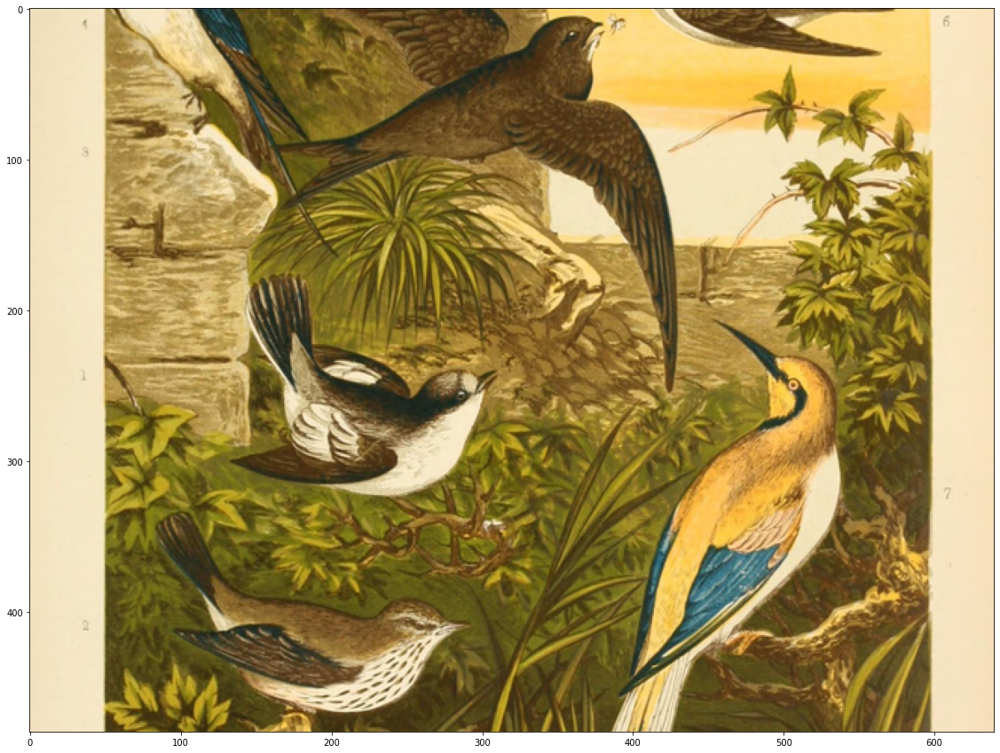

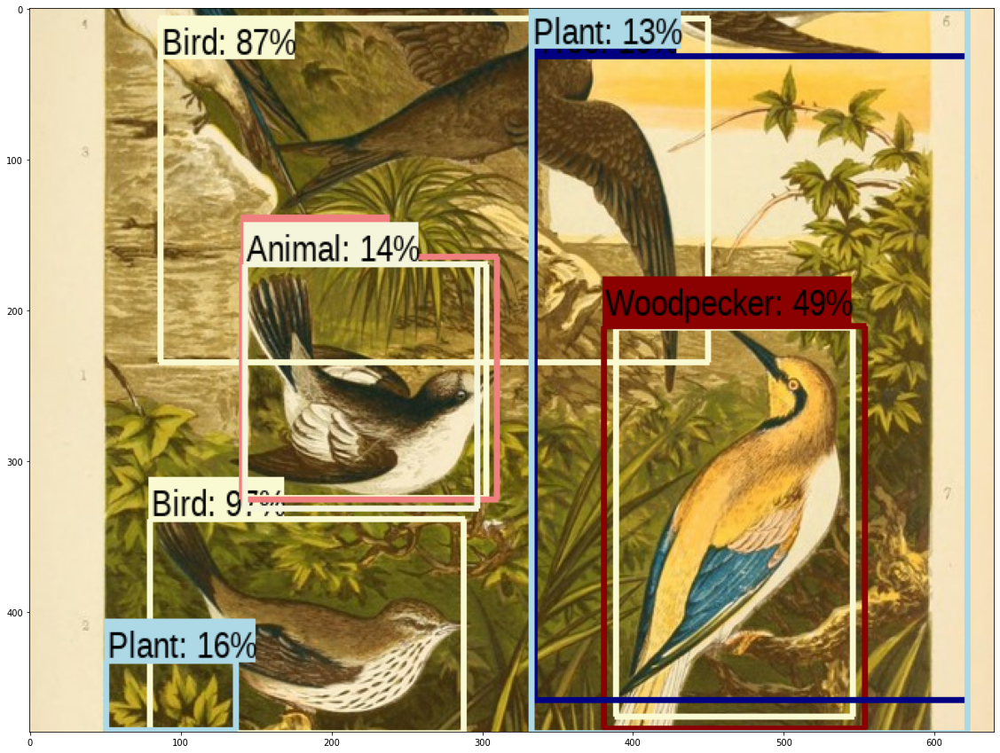

In [27]:
detect_img(image_urls[2])